In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf
from scipy import stats

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)  

# Some styling
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

import plotly.io as pio
pio.renderers.default = 'colab'
pio.templates.default = 'ggplot2'
%matplotlib inline

# Disable warnings 
import warnings
warnings.filterwarnings('ignore')




In [2]:
raw_data_link = 'https://raw.githubusercontent.com/elvanselvano/purwadhika-final-project/main/dataset/DC_Properties.csv'
df = pd.read_csv(raw_data_link, index_col=0)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 158957 entries, 0 to 158956
Data columns (total 48 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   BATHRM              158957 non-null  int64  
 1   HF_BATHRM           158957 non-null  int64  
 2   HEAT                158957 non-null  object 
 3   AC                  158957 non-null  object 
 4   NUM_UNITS           106696 non-null  float64
 5   ROOMS               158957 non-null  int64  
 6   BEDRM               158957 non-null  int64  
 7   AYB                 158686 non-null  float64
 8   YR_RMDL             80928 non-null   float64
 9   EYB                 158957 non-null  int64  
 10  STORIES             106652 non-null  float64
 11  SALEDATE            132187 non-null  object 
 12  PRICE               98216 non-null   float64
 13  QUALIFIED           158957 non-null  object 
 14  SALE_NUM            158957 non-null  int64  
 15  GBA                 106696 non-nul

In [5]:
#casting data types
df['NUM_UNITS'] = df['NUM_UNITS'].astype(pd.Int64Dtype())
df['KITCHENS'] = df['KITCHENS'].astype(pd.Int64Dtype())
df['USECODE'] = df['USECODE'].astype(pd.Int64Dtype()).astype('category')
df['ZIPCODE'] = df['ZIPCODE'].astype(pd.Int64Dtype()).astype('category')
df['CMPLX_NUM'] = df['CMPLX_NUM'].astype(pd.Int64Dtype())
df['CENSUS_TRACT'] = df['CMPLX_NUM'].astype(pd.Int64Dtype())
df['SALEDATE'] = pd.to_datetime(df['SALEDATE'])

## **PRICE**

### Qualified Price

The QUALIFIED feature is internally-used indicator to reflect if a sale is representative of market value according to the office's internal criteria. Since the 'U' means it does not reflect the market value, we will drop the 'U' value and QUALIFIED feature since it only contains 1 value of 'Q'.

In [6]:
df_q = df[df['QUALIFIED']=='Q']
df_q = df_q.drop('QUALIFIED', axis=1)

In [7]:
print('Before removing unqualified:', df.shape)
print('After removing unqualified:', df_q.shape)

Before removing unqualified: (158957, 48)
After removing unqualified: (76349, 47)


### Price by Year

In [8]:
df_q['SALEYEAR'] = df_q['SALEDATE'].dt.year

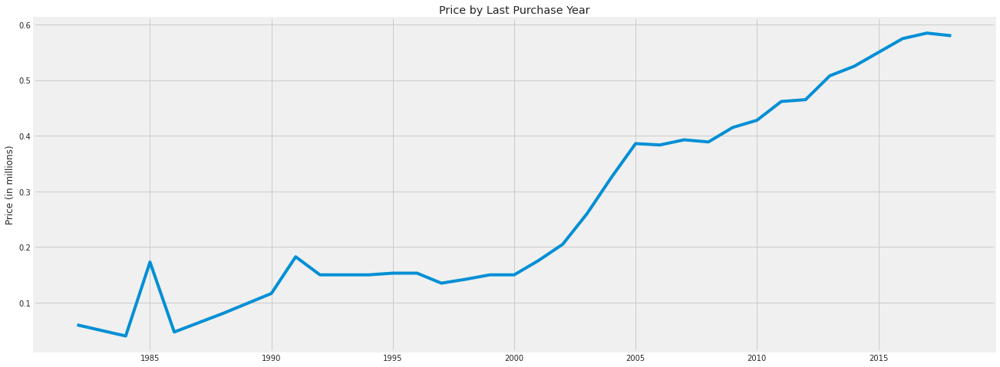

In [294]:
plt.figure(figsize=(20,8))
df_t = df_q.copy()
df_t['PRICE_MIL'] = df_q['PRICE']/1e6
yearly_med_price = df_t.groupby('SALEYEAR').median('PRICE_MIL')
sns.lineplot(x='SALEYEAR',y='PRICE_MIL',data=yearly_med_price,dashes=True)
plt.title('Price by Last Purchase Year')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

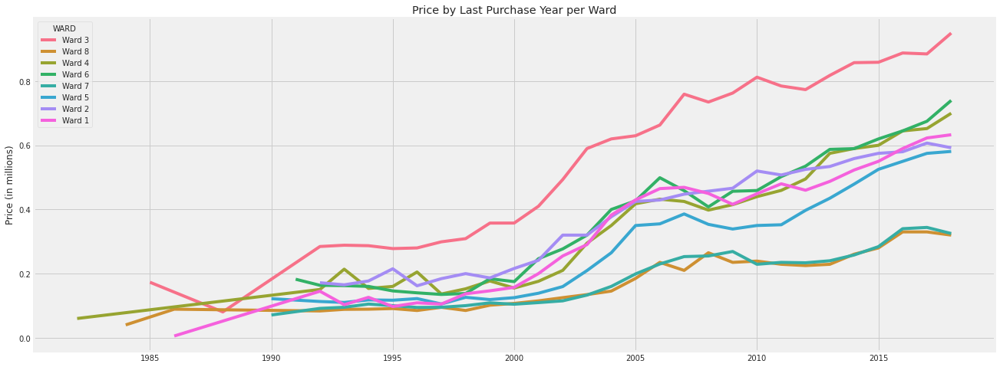

In [295]:
plt.figure(figsize=(20,8))
yearly_ward_price = df_t.groupby(['SALEYEAR','WARD']).median()
sns.lineplot(x='SALEYEAR',y='PRICE_MIL',data=yearly_ward_price , hue='WARD')
plt.title('Price by Last Purchase Year per Ward')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

The first line chart shows the increasing trend of properties price year by year. Since we have no feature that affects the trend, such as inflation, we decide to take more recent price data (2010 onwards)

In addition, the second chart indicates similar increasing trends for each Ward, except Ward 3 which shows more dramatic growth

In [43]:
df_2010 = df_q[df_q['SALEYEAR']>=2010]

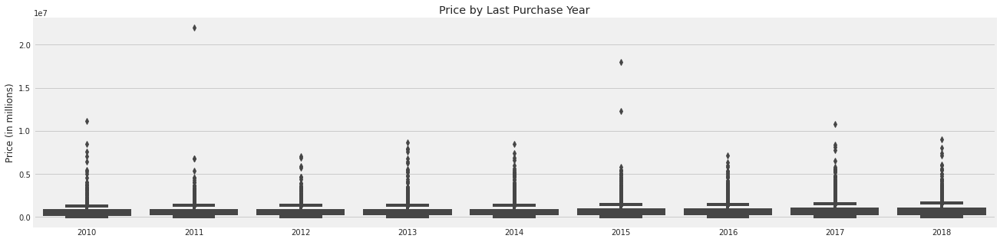

In [44]:
plt.figure(figsize=(20,5))
sns.boxplot(x=df_2010['SALEYEAR'].dropna().astype(int),y=df_2010['PRICE'])
plt.title('Price by Last Purchase Year')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

Based on the visualization above, we can see that there are some outliers that obstruct the visualization and might mislead our insights. Therefore, we will drop the outliers, which is all the data below Q1-1.5 * IQR and all the data above Q3+1.5 * IQR.

In [20]:
q1 = df_2010['PRICE'].quantile(0.25)
q3 = df_2010['PRICE'].quantile(0.75)

iqr = q3-q1
low_whisker = q1 - 1.5*iqr
upp_whisker = q3 + 1.5*iqr

print(low_whisker)
print(upp_whisker)

-271500.0
1412500.0


In [21]:
df_2010_1 = df_2010[df_2010['PRICE']< upp_whisker] #remove outlier

By analizing the shape of the dataframe, we can see that there are 2514 outliers in the price column. 

In [22]:
print('Before removing outliers:', df_2010.shape)
print('After removing outliers:', df_2010_1.shape)

Before removing outliers: (44164, 48)
After removing outliers: (41650, 48)


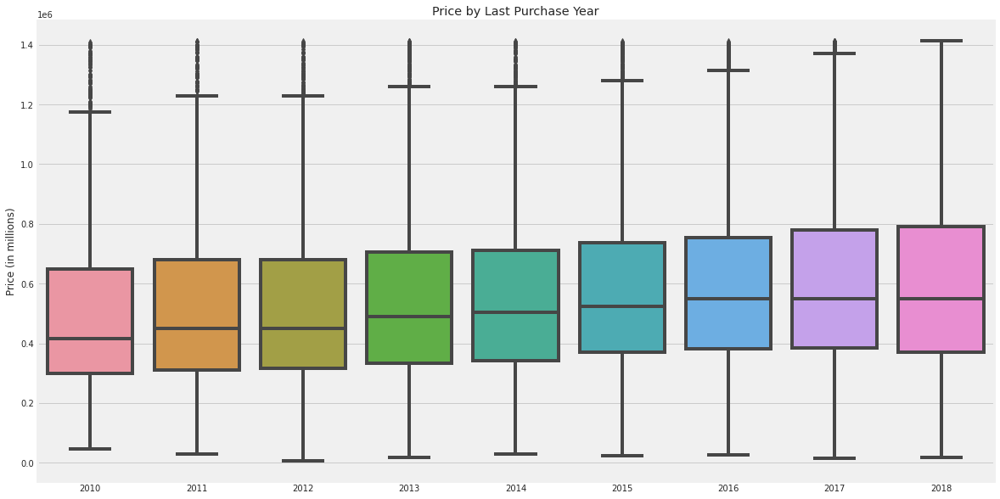

In [24]:
plt.figure(figsize=(18, 10))
sns.boxplot(x=df_2010_1['SALEYEAR'].dropna().astype(int), y=df_2010_1['PRICE'])
plt.title('Price by Last Purchase Year')
plt.xlabel('')
plt.ylabel('Price (in millions)')
plt.show()

### Price Distribution

In [25]:
fig = px.histogram(df_2010_1, x='PRICE', nbins=20, labels={'value': 'Price', 'count': 'number of properties'},
                   marginal='box', title='Distribution of Properties Price in DC',
                   color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_layout(showlegend=False, margin=dict(l=20,r=20,t=40,b=20))
fig.show()

Based on the graph above, the price data is left-skewed. While most properties in DC is around 300-400k USD, the maximum price is on the far-right at around 1.2M-1.3M. It is also important to note that the properties below 100k USD is rare meaning that buying properties in DC seems to be a struggle

Since in the next step, we want to conduct statistical test which require normal distribution. We want to transform the price to normal distribution

In [26]:
df_trans = df_2010_1.copy()
df_trans['PRICE_TRANS'] = np.sqrt(df_2010_1['PRICE'])

In [27]:
fig = px.histogram(df_trans, x='PRICE_TRANS', nbins=15, labels={'value': 'Price', 'count': 'number of properties'},
                   marginal='box', title='Distribution of Properties Price in DC',
                   color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_layout(showlegend=False, margin=dict(l=20,r=20,t=40,b=20))
fig.show()

In [28]:
q1 = df_trans['PRICE_TRANS'].quantile(0.25)
q3 = df_trans['PRICE_TRANS'].quantile(0.75)

iqr = q3-q1
low_whisker = q1 - 1.5*iqr
upp_whisker = q3 + 1.5*iqr

print(low_whisker)
print(upp_whisker)

197.41938397727438
1248.5889688644402


In [29]:
(df_trans[df_trans['PRICE_TRANS']< low_whisker]).shape

(25, 49)

Since there is only few outliers, we will drop them

In [30]:
new_df = df_trans[df_trans['PRICE_TRANS']> 200]

In [34]:
fig = px.histogram(new_df, x='PRICE_TRANS', nbins=11, labels={'value': 'Price', 'count': 'number of properties'},
                   marginal='box', title='Distribution of Properties Price in DC',
                   color_discrete_sequence=px.colors.sequential.RdBu)

fig.update_layout(showlegend=False, margin=dict(l=20,r=20,t=40,b=20))
fig.show()

## **LOCATION**

### Distribution by Region

In [49]:
quadrant = new_df[~new_df['QUADRANT'].isna()]
fig = px.scatter_mapbox(quadrant, lat='LATITUDE', lon='LONGITUDE', color='QUADRANT', hover_data=['QUADRANT', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Quadrant')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

In [48]:
fig = px.scatter_mapbox(new_df, lat='LATITUDE', lon='LONGITUDE', color='WARD', hover_data=['WARD', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Vivid, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Wards')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

In [50]:
fig = px.scatter_mapbox(new_df, lat='LATITUDE', lon='LONGITUDE', color='ZIPCODE', hover_data=['PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Alphabet, zoom=10, height=400, width=800, opacity=1,
                        title='Distribution of Properties by Zipcode')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

In [52]:
fig = px.scatter_mapbox(new_df, lat='LATITUDE', lon='LONGITUDE', color='ASSESSMENT_NBHD', hover_data=['WARD', 'PRICE'],
                        color_discrete_sequence=px.colors.qualitative.Alphabet, zoom=10, height=400, width=1000, opacity=1,
                        title='Distribution of Properties by Neighborhood')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

### House Style in Each Region

In [296]:
style = new_df[~new_df['STYLE'].isna()].copy() #remove missing data style
fig = px.scatter_mapbox(style, lat='LATITUDE', lon='LONGITUDE', color='STYLE', hover_data=['STYLE', 'WARD'],
                        color_discrete_sequence=px.colors.qualitative.Prism, zoom=10, height=400, width=800, opacity=1,
                        title='House Style Mapping')
fig.update_traces(marker=dict(size=5))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

Most of the residential in DC is dominated by 2 Story House. Besides,in the NorthWest (Ward 1,2,3,4), the number of 2.5 Story is quite high, while in the Ward 7, 1 Story residential is also common.

### Regional Price Distribution

In [65]:
#grouping price
price_cat_df = new_df.copy()
label = ['<100k','100-200k','200-300k','300-400k','400-500k','500-600k','600-700k','700-800k','800-900k','900k-1M','1-1.1M','1.1-1.2M','1.2-1.3M','1.3-1.4M','1.4-1.5M']
price_cat_df['PRICE_CAT'] = pd.cut(new_df['PRICE'],bins=[i*100000 for i in range(16)],labels=label)

In [297]:
fig = px.scatter_mapbox(price_cat_df, lat='LATITUDE', lon='LONGITUDE', color='PRICE_CAT', hover_data=['PRICE', 'WARD'],
                        color_discrete_sequence=px.colors.qualitative.Prism, zoom=10, height=400, width=800, opacity=0.5,
                        title='Price Mapping')
fig.update_traces(marker=dict(size=3))
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin=dict(l=10,r=0,t=40,b=10))
fig.show()

The map above indicate the price distribution of residential seems different in each location. We might look to the price distribution in several location features.

In [164]:
#define function of boxplot vs price_trans
def boxplot_cat_price(df,features,rows,cols,fig_size,title,pad=10,rotation=0,ord=True):
  df_no_na = df[features].copy().dropna()

  fig, ax = plt.subplots(rows,cols,figsize=fig_size)
  for i in range(len(features)-1):
    if ord==True:
      table = df_no_na.groupby([features[i]],as_index=False)['PRICE_TRANS'].median().sort_values(by='PRICE_TRANS',ascending=False)
      sns.boxplot(x=features[i],y='PRICE_TRANS',data=df_no_na,ax=ax[i],order=table[features[i]].to_list()).set_title('Price by '+ features[i],fontsize=17)
    elif ord==False :
      sns.boxplot(x=features[i],y='PRICE_TRANS',data=df_no_na,ax=ax[i]).set_title('Price by '+ features[i],fontsize=17)
  for i in fig.axes:
    plt.sca(i)
    plt.xticks(rotation=rotation)
  fig.suptitle(title, fontsize=25, fontweight='bold')
  fig.tight_layout(pad=pad)
  plt.show()

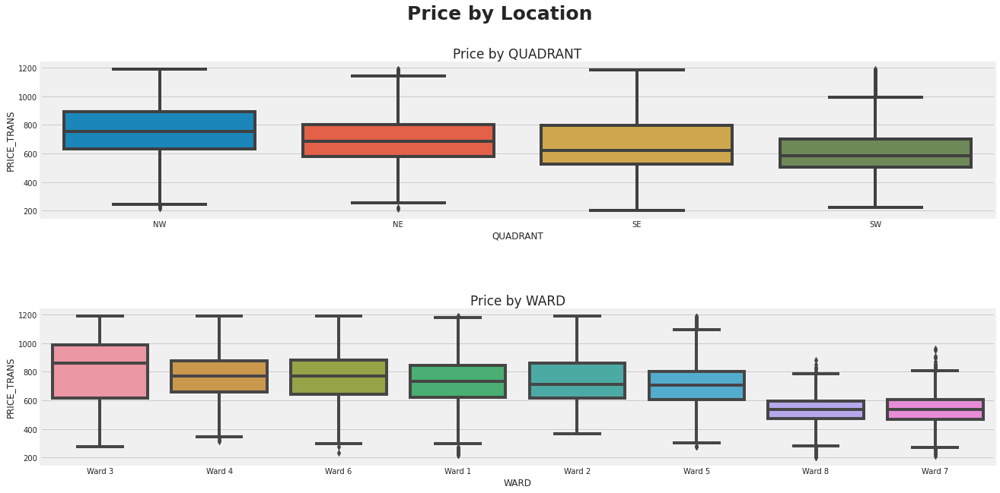

In [190]:
boxplot_cat_price(new_df,['QUADRANT','WARD','PRICE_TRANS'],2,1,(20,10),'Price by Location',7)

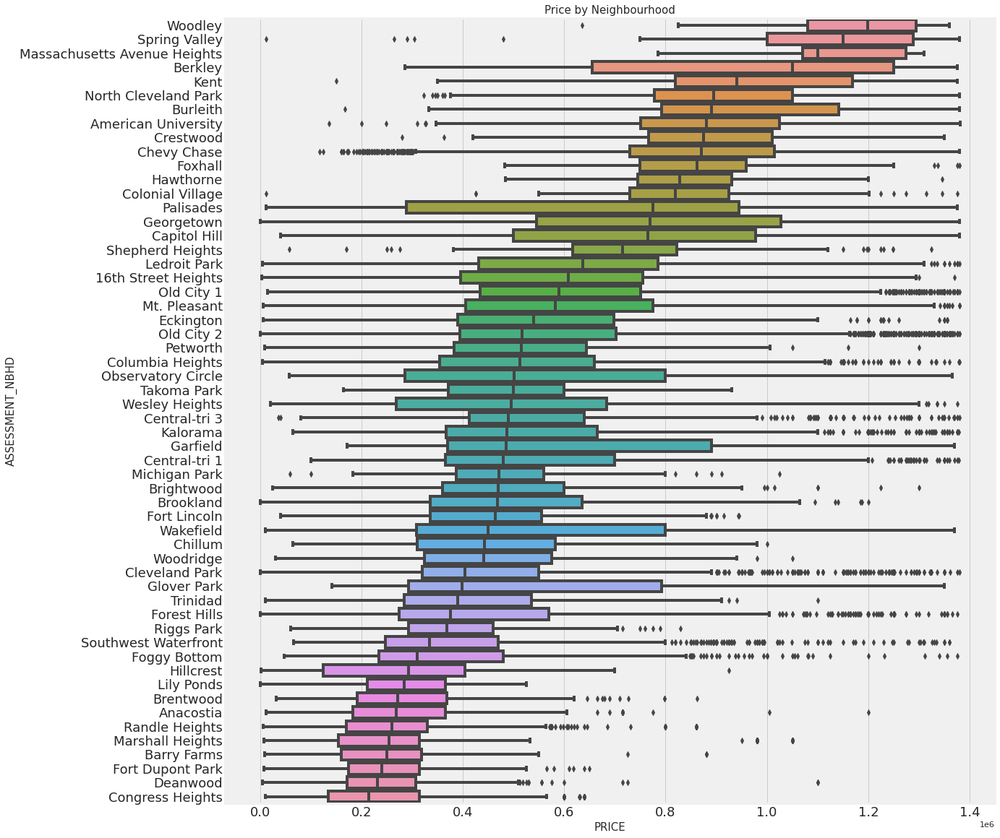

In [113]:
fig=plt.figure(figsize=(17,20))

table = new_df.groupby(['ASSESSMENT_NBHD'],as_index=False)['PRICE'].median().sort_values(by='PRICE',ascending=False)

sns.boxplot(data=new_df,x='PRICE',y='ASSESSMENT_NBHD',order=table['ASSESSMENT_NBHD'].to_list());
plt.yticks(fontsize=18);
plt.xticks(fontsize=18);
plt.title('Price by Neighbourhood',fontsize=15)
plt.ylabel("ASSESSMENT_NBHD",fontsize=15);
plt.xlabel("PRICE",fontsize=15);

In [224]:
#define function anova vs price trans for all categorical value in each feature
def anova_price(feature,df):
  group_df = df[[feature, 'PRICE_TRANS']].dropna().groupby([feature])
  group_list =[]
  val = df[feature].dropna().unique()
  for i in val:
    group_list.append(group_df.get_group(str(i))['PRICE_TRANS'])
  
  f_val, p_val = stats.f_oneway(*group_list)
  print('ANOVA Test results of {}\nF Value = {}\nP = {}'.format(feature,f_val, p_val))

In [269]:
for i in ['QUADRANT','WARD','ASSESSMENT_NBHD']:
  anova_price(i,new_df)
  print()

ANOVA Test results of QUADRANT
F Value = 999.2910639384553
P = 0.0

ANOVA Test results of WARD
F Value = 1368.740861052505
P = 0.0

ANOVA Test results of ASSESSMENT_NBHD
F Value = 366.9398362495777
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the price for each feature are not equal. This shows all three features (Quadrant,Ward, and Assessment NBHD) can distinguish price value.

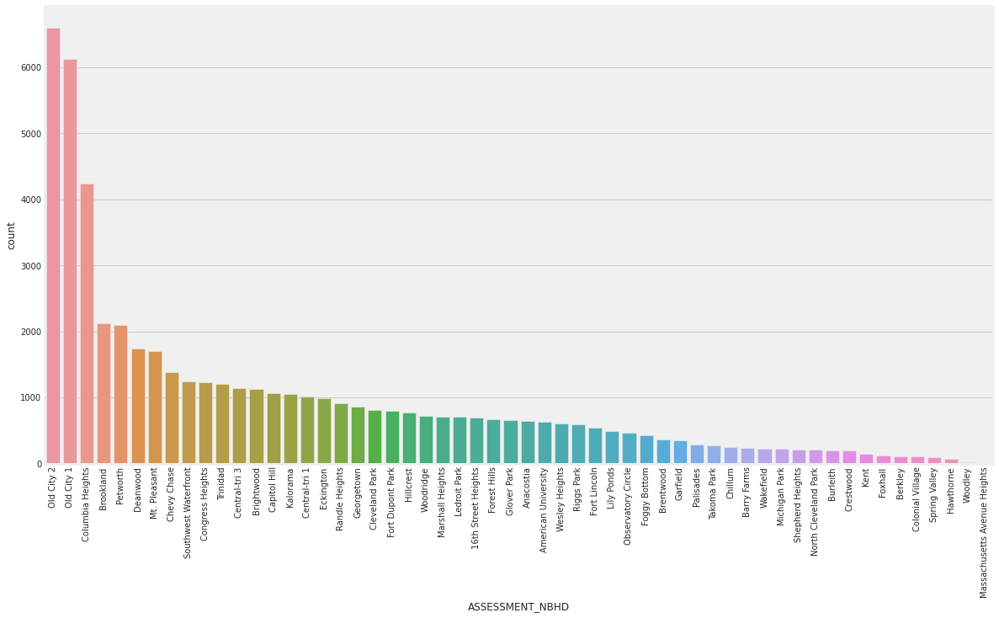

In [ ]:
plt.figure(figsize=(18,10))
ca_count=sns.countplot(x=new_df['ASSESSMENT_NBHD'], order = new_df['ASSESSMENT_NBHD'].value_counts().index)
ca_count.set_xticklabels(ca_count.get_xticklabels(),rotation=90)
plt.show()

## **PROPERTIES FEATURE**

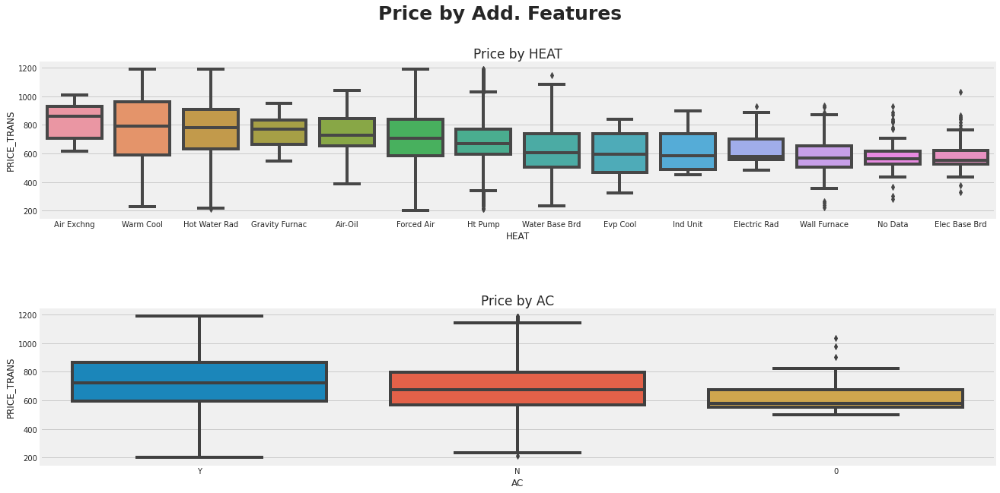

In [274]:
boxplot_cat_price(new_df,['HEAT','AC','PRICE_TRANS'],2,1,(20,10),'Price by Add. Features',7)

Some outlier occurs, we might consider to drop it first

In [235]:
add_feat = new_df.copy()
add_feat['AC'] = np.where(new_df['AC']=='Y',1,0) #change to 1,0
add_feat = add_feat[add_feat['FIREPLACES']<10]

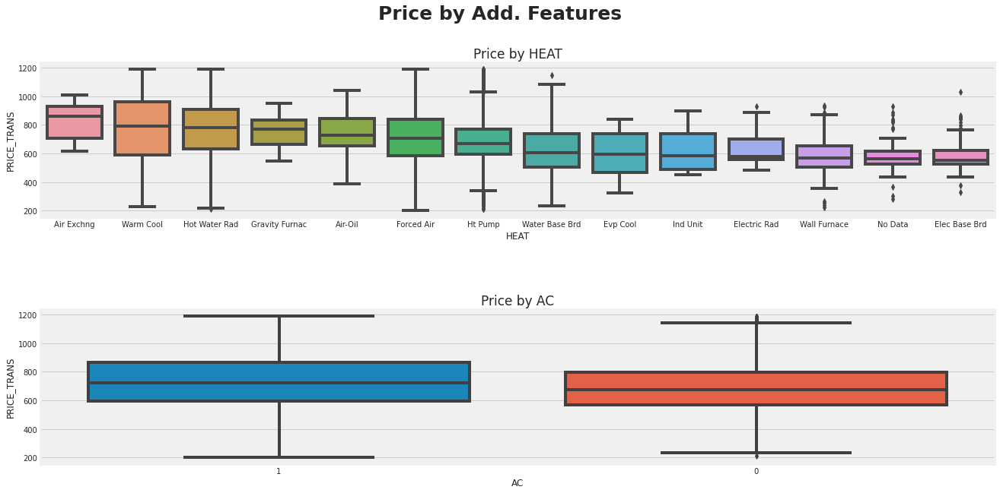

In [272]:
boxplot_cat_price(add_feat,['HEAT','AC','PRICE_TRANS'],2,1,(20,10),'Price by Add. Features',7)

In [275]:
for i in ['HEAT','AC']:
  anova_price(i,add_feat)
  print()

ANOVA Test results of HEAT
F Value = 155.51566161760226
P = 0.0

ANOVA Test results of AC
F Value = 348.35067215669307
P = 2.0088892408808605e-77



Since all the P-Value is below the alpha 0.05, we reject H0 which means the price for each feature are not equal. This shows all three features (Heat and AC) can distinguish price value.

## **GRADE AND CONDITION**

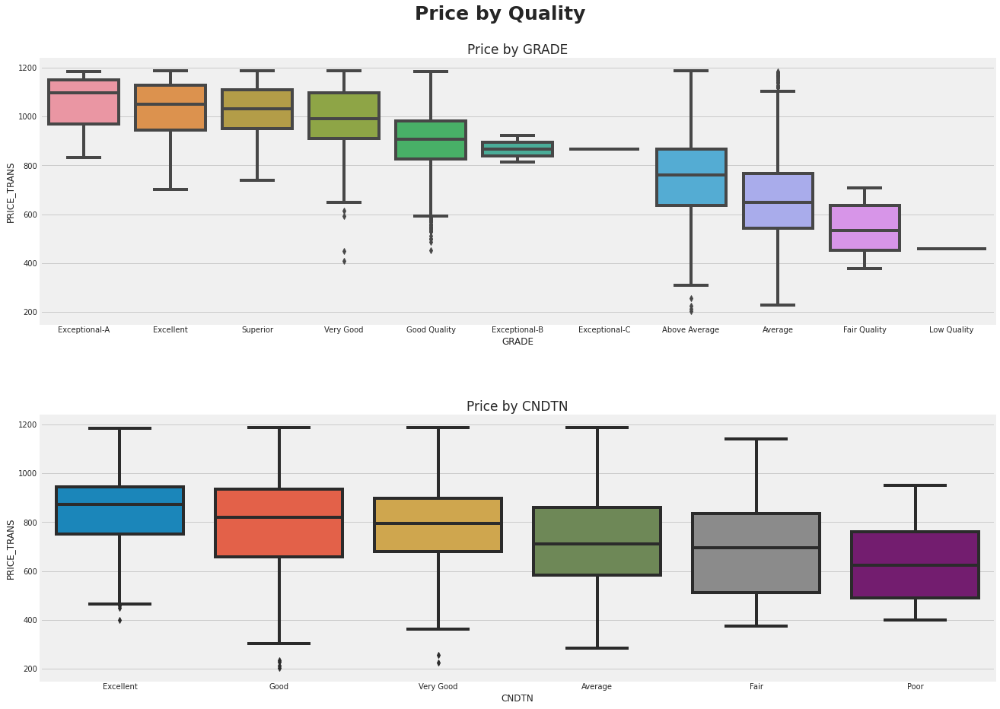

In [166]:
boxplot_cat_price(new_df,['GRADE','CNDTN','PRICE_TRANS'],2,1,(20,14),'Price by Quality',7)

In [267]:
for i in ['GRADE','CNDTN']:
  anova_price(i,new_df)
  print()

ANOVA Test results of GRADE
F Value = 1702.6170822791762
P = 0.0

ANOVA Test results of CNDTN
F Value = 182.42425934995148
P = 3.259774459769882e-191



Since all the P-Value is below the alpha 0.05, we reject H0 which means the price for each feature are not equal. This shows both features (GRADE and CNDTN) can distinguish price value.

## **MATERIAL AND STRUCTURE**

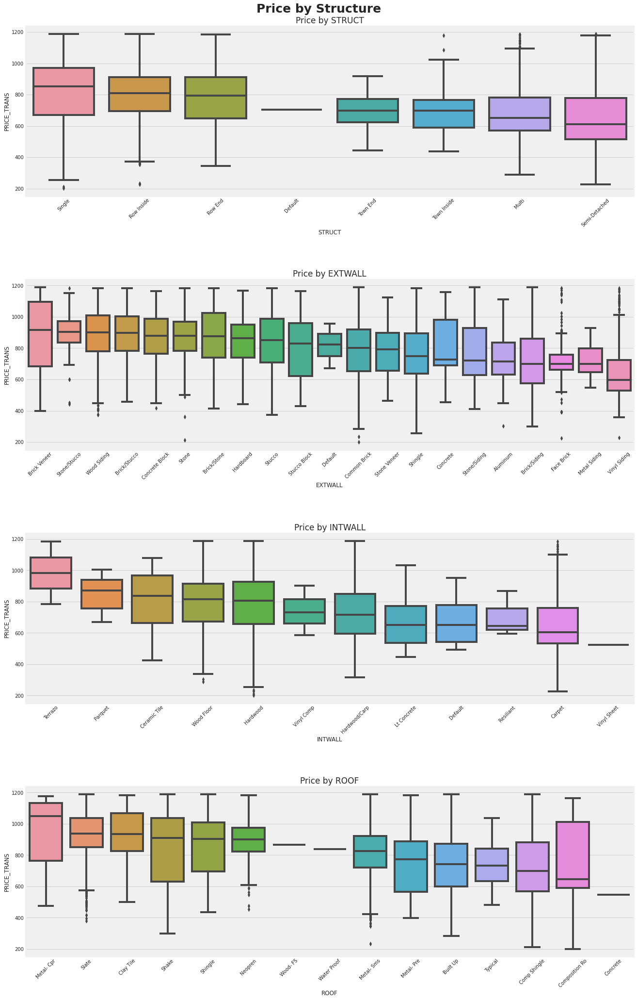

In [134]:
boxplot_cat_price(new_df,['STRUCT','EXTWALL','INTWALL','ROOF','PRICE_TRANS'],4,1,(20,30),'Price by Structure',7,45)

In [266]:
for i in ['STRUCT','EXTWALL','INTWALL','ROOF']:
  anova_price(i,new_df)
  print()

ANOVA Test results of STRUCT
F Value = 356.57818598866015
P = 0.0

ANOVA Test results of EXTWALL
F Value = 80.1545073319735
P = 3.563763e-317

ANOVA Test results of INTWALL
F Value = 63.150916302747156
P = 1.0019759618829641e-139

ANOVA Test results of ROOF
F Value = 206.78794617344514
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the price for each feature are not equal. This shows all four features (Struct, Extwall, Intwall and Roof) can distinguish price value.

## **OTHER NUMERICAL FEATURES**

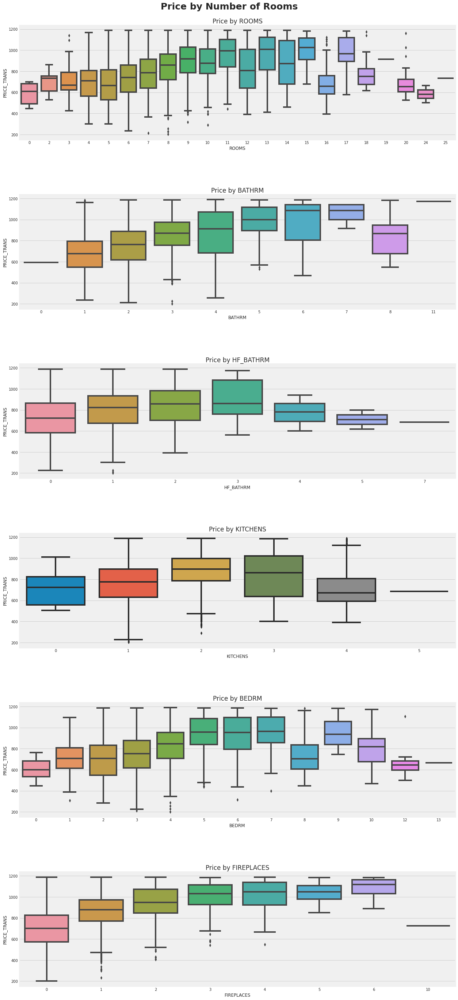

In [278]:
boxplot_cat_price(new_df,['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES','PRICE_TRANS'],6,1,(20,40),'Price by Number of Rooms',10,ord=False)

In [279]:
for i in ['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES']:
  anova_price(i,new_df)
  print()

ANOVA Test results of ROOMS
F Value = 710.1985645491544
P = 0.0

ANOVA Test results of BATHRM
F Value = 1977.474756615978
P = 0.0

ANOVA Test results of HF_BATHRM
F Value = 1084.0818954676415
P = 0.0

ANOVA Test results of KITCHENS
F Value = 235.27111343875336
P = 5.34181053315947e-246

ANOVA Test results of BEDRM
F Value = 1302.8968088285658
P = 0.0

ANOVA Test results of FIREPLACES
F Value = 1364.3714822199174
P = 0.0



Since all the P-Value is below the alpha 0.05, we reject H0 which means the price for each feature are not equal. This shows all features (Rooms, Bathrm, HF_Bathrm, Kitchens, Bedrm, and Fireplaces) can distinguish price value.

Next, we would like to see whether any correlation between these features with price

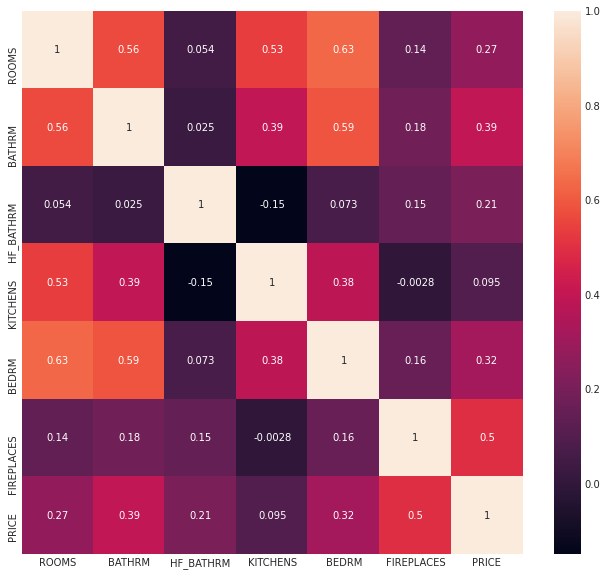

In [309]:
num_feat = new_df[['ROOMS','BATHRM','HF_BATHRM','KITCHENS','BEDRM','FIREPLACES','PRICE']].copy().dropna()

plt.figure(figsize=(10,10))
sns.heatmap(num_feat.corr(), annot=True, cmap='rocket')
plt.show()

1. Number of fireplaces indicates higher correlation (+) to price than any other numerical features.
2. Some multicollinearity might occurs between :
  - Rooms vs (Bedrm, Kitchens, Bathrm)
  - Kitchen vs (Bathrm, Bedrm, Rooms)

In [302]:
!pip install network

  Created wheel for network: filename=network-0.1-cp37-none-any.whl size=3157 sha256=14f9c10291740292b414792caf3863e768ef1f41849419f43b5612ccb049e851
  Stored in directory: /root/.cache/pip/wheels/f6/e7/6a/70989d7246573ac455e33b059ed204518c33e9c276965f005f
Successfully built network


In [305]:
import networkx as nx

In [331]:
corr = new_df.corr()

In [332]:
indices = corr.index.values
cor_matrix = np.asmatrix(corr)
G = nx.from_numpy_matrix(cor_matrix)
G = nx.relabel_nodes(G,lambda x: indices[x])
G.edges(data=True)

EdgeDataView([('BATHRM', 'BATHRM', {'weight': 1.0}), ('BATHRM', 'HF_BATHRM', {'weight': 0.29149841044721675}), ('BATHRM', 'NUM_UNITS', {'weight': 0.3668599927411773}), ('BATHRM', 'ROOMS', {'weight': 0.7025939276142948}), ('BATHRM', 'BEDRM', {'weight': 0.7276952660149775}), ('BATHRM', 'AYB', {'weight': -0.07637395566319186}), ('BATHRM', 'YR_RMDL', {'weight': 0.24428616720145163}), ('BATHRM', 'EYB', {'weight': 0.22550671004943518}), ('BATHRM', 'STORIES', {'weight': 0.005431887526447839}), ('BATHRM', 'PRICE', {'weight': 0.5317159725992049}), ('BATHRM', 'SALE_NUM', {'weight': -0.004677113297859376}), ('BATHRM', 'GBA', {'weight': 0.5970058488394941}), ('BATHRM', 'BLDG_NUM', {'weight': -0.004899659469936637}), ('BATHRM', 'KITCHENS', {'weight': 0.3949781342393159}), ('BATHRM', 'FIREPLACES', {'weight': 0.02483862208161459}), ('BATHRM', 'LANDAREA', {'weight': 0.44774490798777283}), ('BATHRM', 'CMPLX_NUM', {'weight': 0.21871093215788132}), ('BATHRM', 'LIVING_GBA', {'weight': 0.7200693470445211})

In [367]:
def corr_network(G, corr_direction, min_correlation):
    H = G.copy()

    for s1, s2, weight in G.edges(data=True):       
        if corr_direction == "positive":
            if weight["weight"] < 0 or weight["weight"] < min_correlation:
                H.remove_edge(s1, s2)
        else:
            if weight["weight"] >= 0 or weight["weight"] > min_correlation:
                H.remove_edge(s1, s2)
                
    edges,weights = zip(*nx.get_edge_attributes(H,'weight').items())
    
    weights = tuple([(1+abs(x))**2 for x in weights])
   
    d = dict(nx.degree(H))
    nodelist=d.keys()
    node_sizes=d.values()
    
    positions=nx.circular_layout(H)
    
    plt.figure(figsize=(10,10))

    nx.draw_networkx_nodes(H,positions,node_color='#34ebe1',nodelist=nodelist,
                       node_size=tuple([x**3 for x in node_sizes]),alpha=0.8)

    nx.draw_networkx_labels(H, positions, font_size=8)

    if corr_direction == "positive":
        edge_colour = plt.cm.winter 
    else:
        edge_colour = plt.cm.autumn
        
    nx.draw_networkx_edges(H, positions, edgelist=edges,style='solid',
                          width=weights, edge_color = weights, edge_cmap = edge_colour,
                          edge_vmin = min(weights), edge_vmax=max(weights))
    plt.axis('off')
    plt.show() 

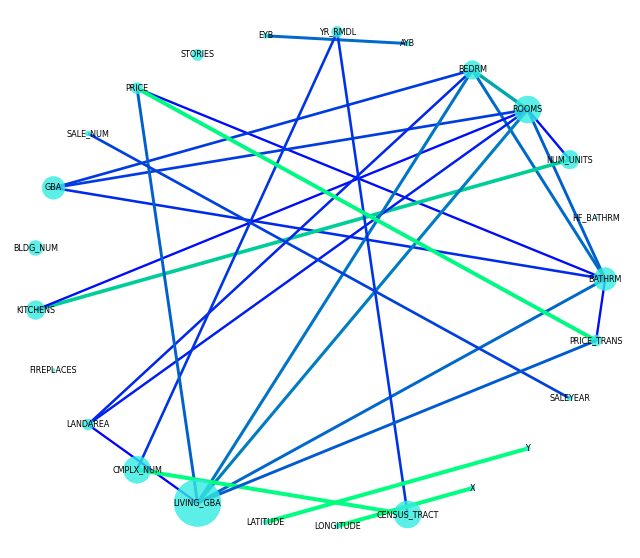

In [368]:
corr_network(G, corr_direction="positive",min_correlation = 0.5)

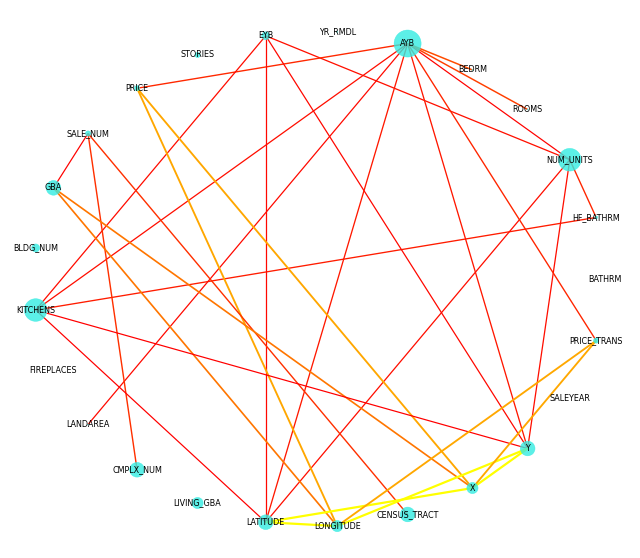

In [369]:
corr_network(G, corr_direction="negative",min_correlation = -0.1)

## Missing Data

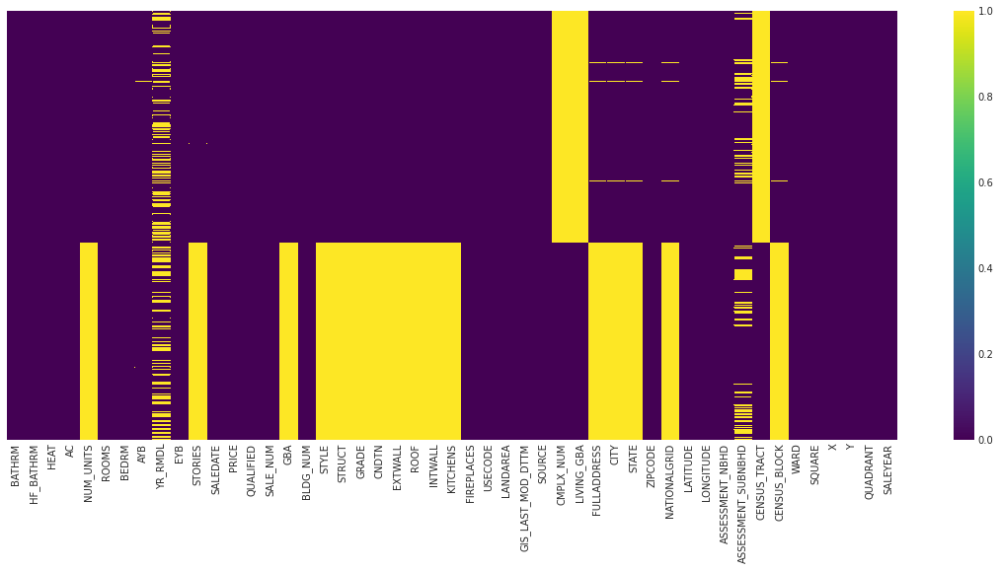

In [ ]:
fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(new_df.isnull(), yticklabels=False,cmap='viridis')
plt.show()

In [ ]:
#drop ASSESSMENT_SUBNBHD, CMPLX_NUM, CENSUS_TRACT, LIVING GBA
df_clean_1 = new_df.drop(['ASSESSMENT_SUBNBHD','CMPLX_NUM','CENSUS_TRACT','LIVING_GBA'],axis=1)

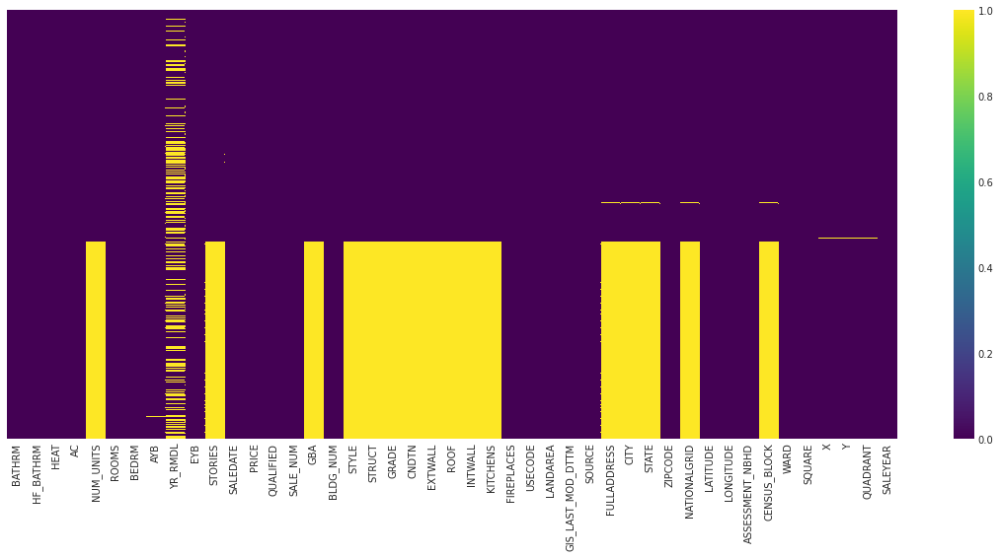

In [ ]:
fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(df_clean_1.isnull(), yticklabels=False,cmap='viridis')
plt.show()

In [ ]:
#drop SALEDATE(using SALEYEAR instead), FULLADDRESS, NATIONALGRID, CENSUS_BLOCK (high cardinality), CITY, STATE (1 value), BLDG_NUM, NUM_UNITS(imbalance),X,Y (similar value with LONGITUDE, LATITUDE)
df_clean_2 = df_clean_1.drop(['SALEDATE','FULLADDRESS','NATIONALGRID','CENSUS_BLOCK','CITY','STATE','BLDG_NUM','NUM_UNITS','X','Y'],axis=1)

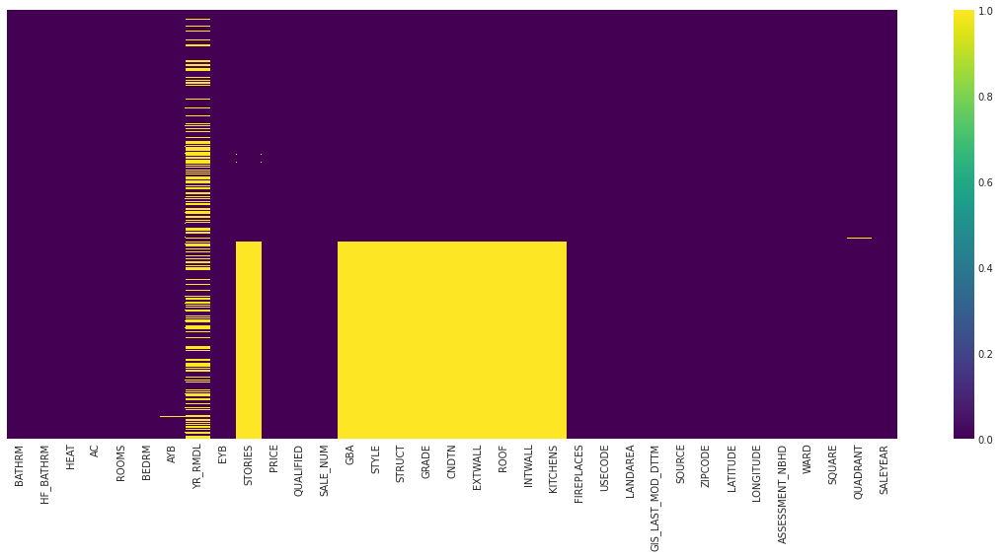

In [ ]:
fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(df_clean_2.isnull(), yticklabels=False,cmap='viridis')
plt.show()

The YR_RMDL seems too important to drop. Intuitively, if the properties have been remodeled, it could affect the price. We try to do feature enginering by replacing the year with the boolean value whether the properties have ever been remodeled or not.

In [ ]:
df_clean_3 = df_clean_2.copy()

In [ ]:
df_clean_3['RMDL'] = np.where(df_clean_2['YR_RMDL'].isna(),0,1)
df_clean_3 = df_clean_3.drop('YR_RMDL',axis=1)

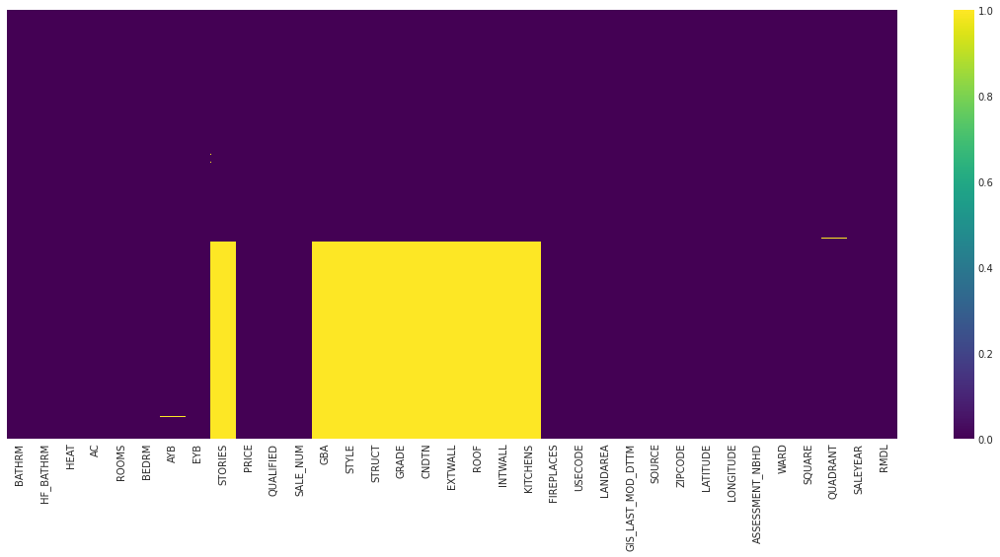

In [ ]:
df_fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(df_clean_3.isnull(), yticklabels=False,cmap='viridis')
plt.show()

Location is indicated by too many features

In [ ]:
df_clean_4 = df_clean_3.drop(['ZIPCODE','LONGITUDE','LATITUDE','ASSESSMENT_NBHD','SQUARE','QUADRANT'],axis=1)

Some feature not related to the properties (update version date and source data)

In [ ]:
df_clean_5 = df_clean_4.drop(['GIS_LAST_MOD_DTTM','SOURCE'],axis=1)

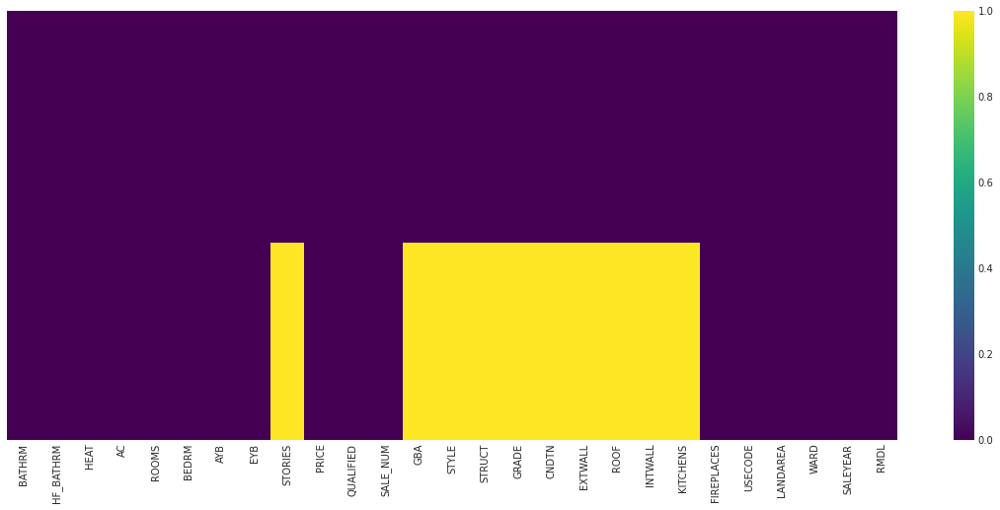

In [ ]:
df_fig, ax = plt.subplots(figsize=(18,8))
sns.heatmap(df_clean_5.isnull(), yticklabels=False,cmap='viridis')
plt.show()

Stories represent similar value with Style. Since Stories has many outlier values, we choose Style instead

In [ ]:
df_clean_6 = df_clean_5.drop('STORIES',axis=1)

Qualified indicating whether the price represent market value according to the office's internal criteria. We are using only qualified price.

In [ ]:
df_clean_8 = df_clean_7.dropna()

CORRELATION

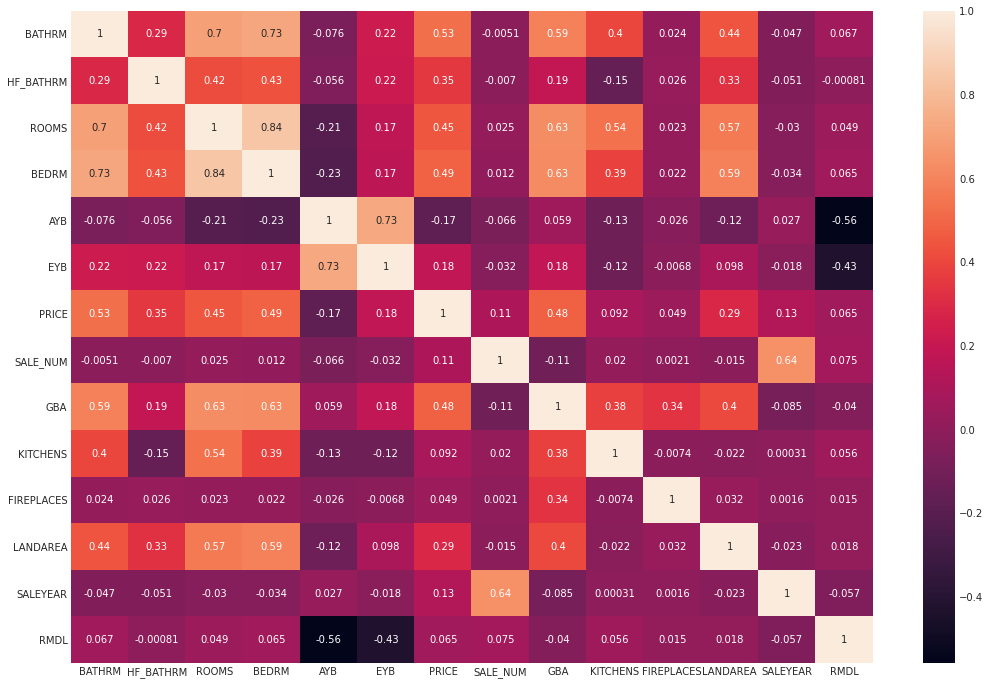

In [ ]:
plt.figure(figsize=(16,12))
sns.heatmap(df_clean_7.corr(),annot=True)
plt.show()

Drop rooms 

In [ ]:
df_clean_9 = df_clean_8.drop(['ROOMS','SALE_NUM'],axis=1)

## **Feature Engineering**

Convert AC Values to 1 0

In [ ]:
df_clean_9.AC.value_counts()

Y    19305
N     4062
0        7
Name: AC, dtype: int64

In [ ]:
df_clean_9['AC'] = np.where(df_clean_9['AC']=='Y',1,0)

In [ ]:
df_clean_9.AC.value_counts()

1    19305
0     4069
Name: AC, dtype: int64

Ordinal Encoding CNDTN

In [ ]:
!pip install category_encoders

     |████████████████████████████████| 81kB 2.9MB/s 


In [ ]:
import category_encoders as ce

In [ ]:
ordinal_mapping = [{'col':'CNDTN','mapping':{'Poor':1,'Fair':2,'Average':3,'Good':4,'Very Good':5,'Excellent':6}}]
ordinal_encoder = ce.OrdinalEncoder(cols ='CNDTN',mapping = ordinal_mapping) 
df_clean_10 = ordinal_encoder.fit_transform(df_clean_9)                                                

In [ ]:
df_clean_10.head()

,BATHRM,HF_BATHRM,HEAT,AC,BEDRM,AYB,EYB,PRICE,GBA,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,USECODE,LANDAREA,WARD,SALEYEAR,RMDL
7,3,1,Hot Water Rad,1,4,1906.0,1972,1050000.0,2401.0,3 Story,Row Inside,Very Good,3,Common Brick,Metal- Sms,Hardwood,2,1,24,1627,Ward 2,2011.0,1
14,3,1,Warm Cool,1,3,1917.0,1967,1325000.0,2692.0,2 Story,Row Inside,Above Average,5,Stucco,Metal- Sms,Hardwood,2,1,24,1815,Ward 2,2011.0,1
16,3,1,Warm Cool,1,3,1908.0,1967,1240000.0,1662.0,2 Story,Row Inside,Above Average,5,Common Brick,Metal- Sms,Hardwood,1,0,11,1424,Ward 2,2010.0,1
23,2,1,Forced Air,1,3,1880.0,1984,1065000.0,1600.0,2 Story,Semi-Detached,Above Average,5,Common Brick,Built Up,Hardwood,1,1,13,2090,Ward 2,2012.0,1
24,2,1,Hot Water Rad,1,3,1880.0,1967,1100000.0,1958.0,2 Story,Single,Above Average,4,Common Brick,Built Up,Hardwood,1,2,12,2090,Ward 2,2012.0,1


In [ ]:
from google.colab import files
df_clean_9.to_csv('df_clean_10.csv',index=False)
files.download('df_clean_10.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>